In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import catboost as cb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import optuna
from optuna import Trial
import os

# Step 1: Load the dataset
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Show head, data types and description
print(df.head())
print(df.dtypes)
print(df.describe())

# Step 4: Drop columns 'Alloy name'
df_reduced = df.drop(columns=['Alloy name'])

# Step 5: Ensure all values in the 'Tempering' column are consistent and then apply label encoding
df_reduced['Tempering'] = df_reduced['Tempering'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['Tempering'] = encoder.fit_transform(df_reduced['Tempering'])

# Step 6: Draw a Spearman correlation heatmap with Blues
corr = df_reduced.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig('/kaggle/working/spearman_correlation_heatmap.png', dpi=500)
plt.show()

# Step 7: Feature importance comparison using Spearman and Pearson
spearman_corr = corr['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)

# Plot both correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Comparison of Feature Importance to Target')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/correlation_comparison.png', dpi=500)
plt.show()

# Step 8: Eliminate poorly correlated features (correlation < |0.001|)
low_corr_features = corr.columns[abs(corr['Thermal Conductivity (W/m-K)']) < 0.001]
df_reduced = df_reduced.drop(columns=low_corr_features)

# Step 9: Show new dataset with their datatype
print(df_reduced.dtypes)

# Step 10: Find Spearman and Pearson correlations with the target variable
spearman_corr = df_reduced.corr(method='spearman')['Thermal Conductivity (W/m-K)']
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)']

# Plot correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Feature Correlations with Target Variable')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/feature_correlation_target.png', dpi=500)
plt.show()

# Save Spearman and Pearson values to CSV
corr_df = pd.DataFrame({'Spearman': spearman_corr, 'Pearson': pearson_corr})
corr_df.to_csv('/kaggle/working/feature_correlations.csv', index=True)

# Step 11: Split the data into training and testing sets
X = df_reduced.drop(columns=['Thermal Conductivity (W/m-K)'])
y = df_reduced['Thermal Conductivity (W/m-K)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 12: Define all models
models = {
    'XGBoost': xgb.XGBRegressor(),
    'CatBoost': cb.CatBoostRegressor(verbose=0),
    'Gradient Boosting': GradientBoostingRegressor(),
    'Stacking Ensemble': StackingRegressor(estimators=[
        ('rf', RandomForestRegressor()),
        ('dt', DecisionTreeRegressor())
    ], final_estimator=LinearRegression()),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'AdaBoost': AdaBoostRegressor(),
    'K-Nearest Neighbor': KNeighborsRegressor(),
    'Linear Regression': LinearRegression(),
}

# Step 13: Hyperparameter tuning with Optuna for all models
def objective(trial: Trial, model_name: str):
    if model_name == 'XGBoost':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        }
        model = xgb.XGBRegressor(**param)
    elif model_name == 'CatBoost':
        param = {
            'iterations': trial.suggest_int('iterations', 100, 1000),
            'depth': trial.suggest_int('depth', 3, 10),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        }
        model = cb.CatBoostRegressor(**param, verbose=0)
    elif model_name == 'Gradient Boosting':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        }
        model = GradientBoostingRegressor(**param)
    elif model_name == 'Stacking Ensemble':
        param = {}  # Stacking model does not have specific parameters
        model = StackingRegressor(estimators=[
            ('rf', RandomForestRegressor()),
            ('dt', DecisionTreeRegressor())
        ], final_estimator=LinearRegression())
    elif model_name == 'Decision Tree':
        param = {
            'max_depth': trial.suggest_int('max_depth', 3, 15),
        }
        model = DecisionTreeRegressor(**param)
    elif model_name == 'Random Forest':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'max_depth': trial.suggest_int('max_depth', 3, 15),
        }
        model = RandomForestRegressor(**param)
    elif model_name == 'AdaBoost':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        }
        model = AdaBoostRegressor(**param)
    elif model_name == 'K-Nearest Neighbor':
        param = {
            'n_neighbors': trial.suggest_int('n_neighbors', 3, 20),
        }
        model = KNeighborsRegressor(**param)
    elif model_name == 'Linear Regression':
        param = {}  # Linear Regression doesn't need tuning
        model = LinearRegression()

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return rmse

# Perform hyperparameter tuning for all models
best_params = {}
for model_name in models.keys():
    study = optuna.create_study(direction='minimize')
    study.optimize(lambda trial: objective(trial, model_name), n_trials=50)
    best_params[model_name] = study.best_params
    print(f"Best params for {model_name}: {best_params[model_name]}")

# Save the best hyperparameters
pd.DataFrame(best_params).to_csv('/kaggle/working/best_hyperparameters.csv', index=False)

# Step 14: Train models with best hyperparameters
best_models = {}
for model_name, model in models.items():
    model.set_params(**best_params[model_name])  # Set the best hyperparameters
    model.fit(X_train, y_train)
    best_models[model_name] = model

# Step 15: Evaluate models
eval_results = []
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    eval_results.append([model_name, r2, rmse, mae])

eval_results_df = pd.DataFrame(eval_results, columns=['Model', 'R²', 'RMSE', 'MAE'])
eval_results_df.to_csv('/kaggle/working/model_evaluations.csv', index=False)

# Step 16: Performance scatter plot (Predicted vs Actual for each model)
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    
    # Create the plot
    plt.figure(figsize=(8, 6))
    
    # Plot actual values in red
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.6)
    
    # Plot predicted values in blue
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.6)
    
    # Plot the diagonal line (perfect prediction)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='--')
    
    # Add labels and title
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Predicted vs Actual - {model_name}')
    
    # Display R², RMSE, and MAE values on the plot
    plt.text(0.05, 0.95, f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}',
             transform=plt.gca().transAxes, fontsize=12, verticalalignment='top', color='black')
    
    
    # Save the plot
    plt.savefig(f'/kaggle/working/predicted_vs_actual_{model_name}.png', dpi=500)
    plt.show()



**High Resolution**

After getting the best **hyperparameters** in our RUN. We loaded it into the next code to get a similar result each time

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import catboost as cb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os

# Step 1: Load the dataset
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Show head, data types and description
print(df.head())
print(df.dtypes)
print(df.describe())

# Step 4: Drop columns 'Alloy name'
df_reduced = df.drop(columns=['Alloy name'])

# Step 5: Ensure all values in the 'Tempering' column are consistent and then apply label encoding
df_reduced['Tempering'] = df_reduced['Tempering'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['Tempering'] = encoder.fit_transform(df_reduced['Tempering'])

# Step 6: Draw a Spearman correlation heatmap with Blues
corr = df_reduced.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig('/kaggle/working/spearman_correlation_heatmap.png', dpi=500)
plt.show()

# Step 7: Feature importance comparison using Spearman and Pearson
spearman_corr = corr['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)

# Plot both correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Comparison of Feature Importance to Target')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/correlation_comparison.png', dpi=100)
plt.show()

# Step 8: Eliminate poorly correlated features (correlation < |0.001|)
low_corr_features = corr.columns[abs(corr['Thermal Conductivity (W/m-K)']) < 0.001]
df_reduced = df_reduced.drop(columns=low_corr_features)

# Step 9: Show new dataset with their datatype
print(df_reduced.dtypes)

# Step 10: Find Spearman and Pearson correlations with the target variable
spearman_corr = df_reduced.corr(method='spearman')['Thermal Conductivity (W/m-K)']
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)']

# Plot correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Feature Correlations with Target Variable')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/feature_correlation_target.png', dpi=1000)
plt.show()

# Save Spearman and Pearson values to CSV
corr_df = pd.DataFrame({'Spearman': spearman_corr, 'Pearson': pearson_corr})
corr_df.to_csv('/kaggle/working/feature_correlations.csv', index=True)

# Step 11: Split the data into training and testing sets
X = df_reduced.drop(columns=['Thermal Conductivity (W/m-K)'])
y = df_reduced['Thermal Conductivity (W/m-K)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 12: Define all models with predefined hyperparameters from the CSV file
models = {
    'XGBoost': xgb.XGBRegressor(n_estimators=135, max_depth=3, learning_rate=0.19957617),
    'CatBoost': cb.CatBoostRegressor(iterations=912, depth=3, learning_rate=0.055646369, verbose=0),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=244, max_depth=3, learning_rate=0.097171524),
    'Stacking Ensemble': StackingRegressor(estimators=[
        ('rf', RandomForestRegressor()),
        ('dt', DecisionTreeRegressor())
    ], final_estimator=LinearRegression()),
    'Decision Tree': DecisionTreeRegressor(max_depth=11),
    'Random Forest': RandomForestRegressor(n_estimators=120, max_depth=9),
    'AdaBoost': AdaBoostRegressor(n_estimators=148, learning_rate=0.06430105),
    'K-Nearest Neighbor': KNeighborsRegressor(n_neighbors=6),
    'Linear Regression': LinearRegression(),
}

# Step 13: Train models with predefined hyperparameters
best_models = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    best_models[model_name] = model

# Step 14: Evaluate models
eval_results = []
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    eval_results.append([model_name, r2, rmse, mae])

eval_results_df = pd.DataFrame(eval_results, columns=['Model', 'R²', 'RMSE', 'MAE'])
eval_results_df.to_csv('/kaggle/working/model_evaluations.csv', index=False)


# Loop through the models in best_models
for model_name, model in best_models.items():
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    
    # Create the plot with high resolution
    plt.figure(figsize=(10, 8), dpi=1000)  # High resolution (1000 dpi for clarity)
    
    # Scatter plot for actual vs predicted
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.6, s=200)
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.6, s=200)
    
    # Plot the diagonal line (perfect prediction) with a solid line
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='-', label='Perfect Prediction')
    
    # Add labels and title with Times New Roman font, bold, and slightly larger size
    plt.xlabel('Actual', fontsize=24, fontweight='bold', fontname='Times New Roman')
    plt.ylabel('Predicted ', fontsize=24, fontweight='bold', fontname='Times New Roman')
    plt.title(f'{model_name}', fontsize=18, fontweight='bold', fontname='Times New Roman')
    
    # Display R², RMSE, and MAE values on the plot
    plt.text(0.05, 0.95, f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}',
             transform=plt.gca().transAxes, fontsize=20, fontweight='bold', verticalalignment='top', color='black', fontname='Times New Roman')
    
    
    # Save the plot with the highest resolution (1000 dpi)
    plt.savefig(f'predicted_vs_actual_{model_name}.png', dpi=1000)  # Saving at 1000 dpi
    plt.show()

    # Save the data (actual vs predicted) to a CSV file
    plot_data = pd.DataFrame({
        'Actual': y_test,
        'Predicted': y_pred
    })
    plot_data.to_csv(f'predicted_vs_actual_{model_name}.csv', index=False)



With Short name in figures

In [ ]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

# 1. Import the file (make sure the file is in the correct directory)
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'  # Adjust this path as per your dataset
df = pd.read_excel(file_path)

# 2. Output file path
output_file_path = '/kaggle/working/'

# 3. Fill the empty cells with zero
df.fillna(0, inplace=True)

# 4. Show head, data type analytics, and description
# Rename columns as per the required format
df.rename(columns={
    'Thermal Conductivity (W/m-K)': 'TC',
    'Ultimate Tensile Strength': 'UTS',
    'Yield Strength (MPa)': 'YTS',
    'Aluminum , AI': 'Al',
    'Silicon, Si': 'Si',
    'Copper, Cu': 'Cu',
    'Iron, Fe': 'Fe',
    'Magnesium, Mg': 'Mg',
    'Zinc, Zn': 'Zn',
    'Manganese, Mn': 'Mn',
    'Titanium, Ti': 'Ti',
    'Chromium, Cr': 'Cr',
    'Nickel, Ni': 'Ni',
    'Zirconium, Zr': 'Zr',
    'Tin, Sn': 'Sn',
    'Vanadium, V': 'V',
    'Bismuth, Bi': 'Bi',
    'Tempering': 'TD'  # Renaming Tempering to TD
}, inplace=True)

# Show head, data types, and description
df_head = df.head()
df_dtypes = df.dtypes
df_description = df.describe()

# Display the data (this will print the first few rows, column types, and description)
print(df_head)
print(df_dtypes)
print(df_description)

# 5. Drop 'Alloy name' column and save the new dataset
df_dropped_alloy = df.drop(columns=['Alloy name'])

# 6. Perform Target Encoding for 'TD' column
encoder = LabelEncoder()

# Ensure that 'TD' column is of type string
df_dropped_alloy['TD'] = df_dropped_alloy['TD'].astype(str)

# Apply the LabelEncoder
df_dropped_alloy['TD'] = encoder.fit_transform(df_dropped_alloy['TD'])

# 7. Move 'TC' column to the first position
cols = ['TC'] + [col for col in df_dropped_alloy if col != 'TC']  # Rearranging the columns
df_dropped_alloy = df_dropped_alloy[cols]

# 8. Create Correlation heatmaps
# Spearman correlation heatmap
plt.figure(figsize=(12, 8), dpi=1000)
spearman_corr = df_dropped_alloy.corr(method='spearman')
sns.heatmap(spearman_corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig(output_file_path + 'spearman_correlation_heatmap.png')

# Normal (Kendall) correlation heatmap
plt.figure(figsize=(12, 8), dpi=1000)
normal_corr = df_dropped_alloy.corr(method='kendall')
sns.heatmap(normal_corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Normal Correlation Coefficients Heatmap')
plt.savefig(output_file_path + 'normal_correlation_heatmap.png')

# Pearson correlation heatmap
plt.figure(figsize=(12, 8), dpi=1000)
pearson_corr = df_dropped_alloy.corr(method='pearson')
sns.heatmap(pearson_corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Pearson Correlation Heatmap')
plt.savefig(output_file_path + 'pearson_correlation_heatmap.png')

# Display the first heatmap for verification
plt.show()

# 9. Calculate Pearson and Spearman correlations with 'TD'
pearson_corr_td = pearson_corr['TD'].drop('TD')  # Drop 'TD' itself from Pearson correlation
spearman_corr_td = spearman_corr['TD'].drop('TD')  # Drop 'TD' itself from Spearman correlation

# 10. Create bar chart for Pearson correlation with TD
plt.figure(figsize=(10, 6))
pearson_corr_td.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Pearson Correlation with TD')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(output_file_path + 'pearson_correlation_with_td.png')

# 11. Create bar chart for Spearman correlation with TD
plt.figure(figsize=(10, 6))
spearman_corr_td.plot(kind='bar', color='lightcoral', edgecolor='black')
plt.title('Spearman Correlation with TD')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(output_file_path + 'spearman_correlation_with_td.png')

# 12. Save the correlation coefficients to a CSV file
correlation_data = pd.DataFrame({
    'Feature': pearson_corr_td.index,
    'Pearson_Correlation': pearson_corr_td.values,
    'Spearman_Correlation': spearman_corr_td.values
})

# Save the dataframe to a CSV file
correlation_data.to_csv(output_file_path + 'correlation_coefficients.csv', index=False)

# Display the bar charts
plt.show()


In [ ]:
# 9. Calculate Pearson and Spearman correlations with 'TD'
pearson_corr_td = pearson_corr['TC'].drop('TC')  # Drop 'TD' itself from Pearson correlation
spearman_corr_td = spearman_corr['TC'].drop('TC')  # Drop 'TD' itself from Spearman correlation

# Set Times New Roman font for all plot elements
plt.rcParams['font.family'] = 'Times New Roman'

# 10. Create a grouped bar chart for comparison between Pearson and Spearman correlations
plt.figure(figsize=(12, 8))

# Define the positions for the bars
x = range(len(pearson_corr_td))

# Set the width of the bars
bar_width = 0.35

# Plot Pearson correlations with TD (using a more neutral color: blue)
plt.bar(x, pearson_corr_td.values, width=bar_width, color='#4C8CFF', edgecolor='black', label='Pearson', zorder=3)

# Plot Spearman correlations with TD (using a more neutral color: gray)
plt.bar([p + bar_width for p in x], spearman_corr_td.values, width=bar_width, color='#B0B0B0', edgecolor='black', label='Spearman', zorder=3)

# Add titles and labels with slightly larger font sizes
plt.title('Pearson vs Spearman Correlation with Thermal Conductivity', fontsize=18, fontweight='bold')
plt.xlabel('Features', fontsize=16)
plt.ylabel('Correlation Coefficient', fontsize=16)

# Set tick labels with larger font sizes
plt.xticks([p + bar_width / 2 for p in x], pearson_corr_td.index, rotation=90, ha='right', fontsize=16)
plt.yticks(fontsize=16)

# Add gridlines for clarity
plt.grid(True, axis='y', linestyle='--', alpha=0.6, zorder=1)

# Move the legend to the bottom-right corner inside the plot with a box around it
plt.legend(fontsize=14, loc='lower right', bbox_to_anchor=(1, 0), ncol=2, frameon=True, facecolor='white', edgecolor='black')

# Adjust layout for better readability
plt.tight_layout()

# Save the figure in high resolution for publication quality
plt.savefig(output_file_path + 'pearson_vs_spearman_correlation_comparison-final.png', dpi=1000)

# Display the plot
plt.show()

# 11. Save the correlation coefficients to a CSV file
correlation_data = pd.DataFrame({
    'Feature': pearson_corr_td.index,
    'Pearson_Correlation': pearson_corr_td.values,
    'Spearman_Correlation': spearman_corr_td.values
})

# Save the dataframe to a CSV file
correlation_data.to_csv(output_file_path + 'correlation_coefficients_comparison-final.csv', index=False)


To count the Temper Designation unique entries

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# 1. Import the file
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
try:
    df = pd.read_excel(file_path)
    print(f"Successfully loaded data from: {file_path}")
except FileNotFoundError:
    print(f"Error: File not found at {file_path}. Please check the file path.")
    exit()

# 2. Output file path
output_file_path = '/kaggle/working/'

# 3. Fill the empty cells with zero
df.fillna(0, inplace=True)
print("\nEmpty cells filled with zero.")

# 4. Rename columns
df.rename(columns={
    'Thermal Conductivity (W/m-K)': 'TC',
    'Ultimate Tensile Strength': 'UTS',
    'Yield Strength (MPa)': 'YTS',
    'Aluminum , AI': 'Al',
    'Silicon, Si': 'Si',
    'Copper, Cu': 'Cu',
    'Iron, Fe': 'Fe',
    'Magnesium, Mg': 'Mg',
    'Zinc, Zn': 'Zn',
    'Manganese, Mn': 'Mn',
    'Titanium, Ti': 'Ti',
    'Chromium, Cr': 'Cr',
    'Nickel, Ni': 'Ni',
    'Zirconium, Zr': 'Zr',
    'Tin, Sn': 'Sn',
    'Vanadium, V': 'V',
    'Bismuth, Bi': 'Bi',
    'Tempering': 'TD'
}, inplace=True)
print("Columns renamed successfully.")

# Show head, data types, and description
df_head = df.head()
df_dtypes = df.dtypes
df_description = df.describe()

print("\nHead of the DataFrame:")
print(df_head)

print("\nData types of the columns:")
print(df_dtypes)

print("\nDescription of the DataFrame:")
print(df_description)

# Save the description to an Excel file
description_df = pd.DataFrame(df_description)
description_output_path = f'{output_file_path}data_description.xlsx'
description_df.to_excel(description_output_path)
print(f"\nData description saved to: {description_output_path}")

# 5. Drop 'Alloy name' column
df_dropped_alloy = df.drop(columns=['Alloy name'])
print("\n'Alloy name' column dropped.")

# 6. Perform Target Encoding for 'TD' column
encoder = LabelEncoder()

# Ensure that 'TD' column is of type string
df_dropped_alloy['TD'] = df_dropped_alloy['TD'].astype(str)

# Apply the LabelEncoder
df_dropped_alloy['TD_Encoded'] = encoder.fit_transform(df_dropped_alloy['TD'])

# Create a DataFrame to store the encoding mapping for the report
label_encoding_df = pd.DataFrame({'Original_TD': encoder.classes_, 'Encoded_TD': encoder.transform(encoder.classes_)})
label_encoding_output_path = f'{output_file_path}tempering_label_encoding.xlsx'
label_encoding_df.to_excel(label_encoding_output_path, index=False)
print(f"\nLabel encoding for 'TD' saved to: {label_encoding_output_path}")
print("\nLabel Encoding Insights:")
print(label_encoding_df)
print("\nThis table shows the mapping between the original tempering categories and their corresponding numerical encodings.")

# 7. Move 'TC' column to the first position
cols = ['TC'] + [col for col in df_dropped_alloy if col != 'TC']
df_dropped_alloy = df_dropped_alloy[cols]
print("\n'TC' column moved to the first position.")

# Save the modified DataFrame to a new Excel file
modified_df_output_path = f'{output_file_path}modified_dataset.xlsx'
df_dropped_alloy.to_excel(modified_df_output_path, index=False)
print(f"\nModified dataset saved to: {modified_df_output_path}")

# List out and count unique tempering features
unique_tempering = df['TD'].unique()
tempering_counts = df['TD'].value_counts().reset_index()
tempering_counts.columns = ['Tempering_Feature', 'Count']

# Save unique tempering features and their counts to an Excel file
unique_tempering_df = pd.DataFrame({'Unique_Tempering_Features': unique_tempering})
unique_tempering_output_path = f'{output_file_path}unique_tempering_features.xlsx'
unique_tempering_df.to_excel(unique_tempering_output_path, index=False)
print(f"\nUnique tempering features saved to: {unique_tempering_output_path}")

# Save tempering counts to an Excel file
tempering_counts_output_path = f'{output_file_path}tempering_feature_counts.xlsx'
tempering_counts.to_excel(tempering_counts_output_path, index=False)
print(f"Tempering feature counts saved to: {tempering_counts_output_path}")

SHAP analysis for XGB model

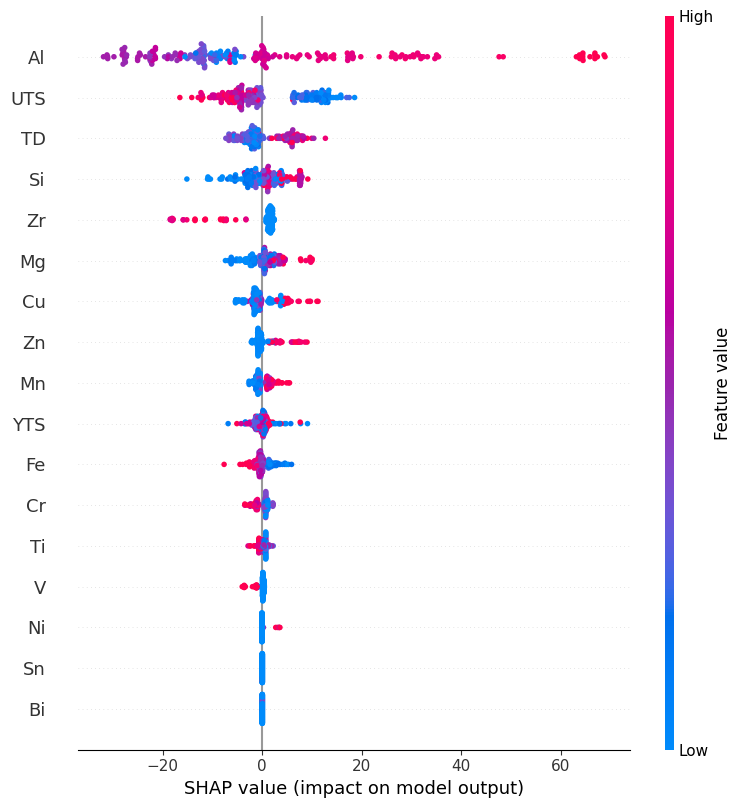

Feature importance values have been saved to 'feature_importance_shap.xlsx'.


In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import xgboost as xgb
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Step 1: Load the dataset
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Rename columns to shorter names
df.rename(columns={
    'Thermal Conductivity (W/m-K)': 'TC',
    'Ultimate Tensile Strength': 'UTS',
    'Yield Strength (MPa)': 'YTS',
    'Aluminum , AI': 'Al',
    'Silicon, Si': 'Si',
    'Copper, Cu': 'Cu',
    'Iron, Fe': 'Fe',
    'Magnesium, Mg': 'Mg',
    'Zinc, Zn': 'Zn',
    'Manganese, Mn': 'Mn',
    'Titanium, Ti': 'Ti',
    'Chromium, Cr': 'Cr',
    'Nickel, Ni': 'Ni',
    'Zirconium, Zr': 'Zr',
    'Tin, Sn': 'Sn',
    'Vanadium, V': 'V',
    'Bismuth, Bi': 'Bi',
    'Tempering': 'TD'
}, inplace=True)

# Step 4: Drop the 'Alloy name' column
df_reduced = df.drop(columns=['Alloy name'])

# Step 5: Ensure all values in the 'TD' column are consistent and apply label encoding
df_reduced['TD'] = df_reduced['TD'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['TD'] = encoder.fit_transform(df_reduced['TD'])

# Step 6: Split the data into training and testing sets
X = df_reduced.drop(columns=['TC'])
y = df_reduced['TC']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 7: Define the XGBoost model with predefined hyperparameters
xgb_model = xgb.XGBRegressor(
    n_estimators=135, 
    max_depth=3, 
    learning_rate=0.19957617
)

# Step 8: Train the XGBoost model
xgb_model.fit(X_train, y_train)

# Step 9: Use SHAP to calculate feature importance
explainer = shap.Explainer(xgb_model, X_train)
shap_values = explainer(X_train)

# Step 10: Customize matplotlib font settings (font family and size)
plt.rcParams.update({
    'font.family': 'Times New Roman',  # Set font to Times New Roman
    'font.size': 14,                   # Increase font size
    'axes.labelsize': 14,              # Axis labels font size
    'xtick.labelsize': 12,             # X-axis tick font size
    'ytick.labelsize': 12,             # Y-axis tick font size
    'axes.titleweight': 'bold',        # Bold axis titles
})

# Step 11: Capture the SHAP summary plot using a figure
fig = plt.figure(figsize=(20, 16))
shap.summary_plot(shap_values, X_train, show=False)

# Save the plot as a high-resolution SVG image (vector format)
fig.savefig('/kaggle/working/shap_feature_importance_plot-2.png', format='png', dpi=1000)
plt.show()

# Step 12: Extract feature importance values and save them to an Excel file
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'SHAP Importance': np.abs(shap_values.values).mean(axis=0)
})

# Sort by importance
feature_importance_sorted = feature_importance.sort_values(by='SHAP Importance', ascending=False)

# Save to Excel
feature_importance_sorted.to_excel('/kaggle/working/feature_importance_shap.xlsx', index=False)

print("Feature importance values have been saved to 'feature_importance_shap.xlsx'.")


  Alloy name Tempering  Thermal Conductivity (W/m-K)  \
0   1050-H14       H14                         227.0   
1   1050-H16       H16                         227.0   
2   1050-H18       H18                         227.0   
3     1050-O         O                         231.0   
4  1060-H112      H112                         234.0   

   Ultimate Tensile Strength  Yield Strength (MPa)  Aluminum , AI  \
0                      110.0                 103.0           99.5   
1                      131.0                 124.0           99.5   
2                      160.0                 145.0           99.5   
3                       76.0                  28.0           99.5   
4                       76.5                  17.0           99.6   

   Silicon, Si  Copper, Cu  Iron, Fe  Magnesium, Mg  Zinc, Zn  Manganese, Mn  \
0         0.25        0.05      0.40           0.05      0.05           0.05   
1         0.25        0.05      0.40           0.05      0.05           0.05   
2       

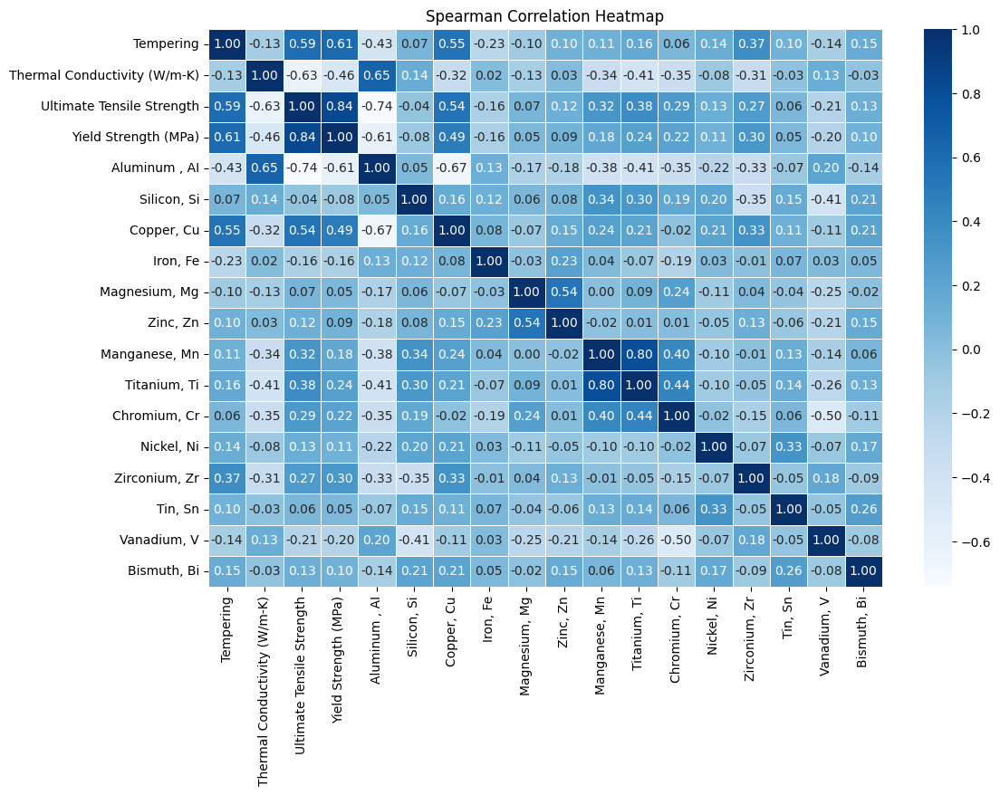

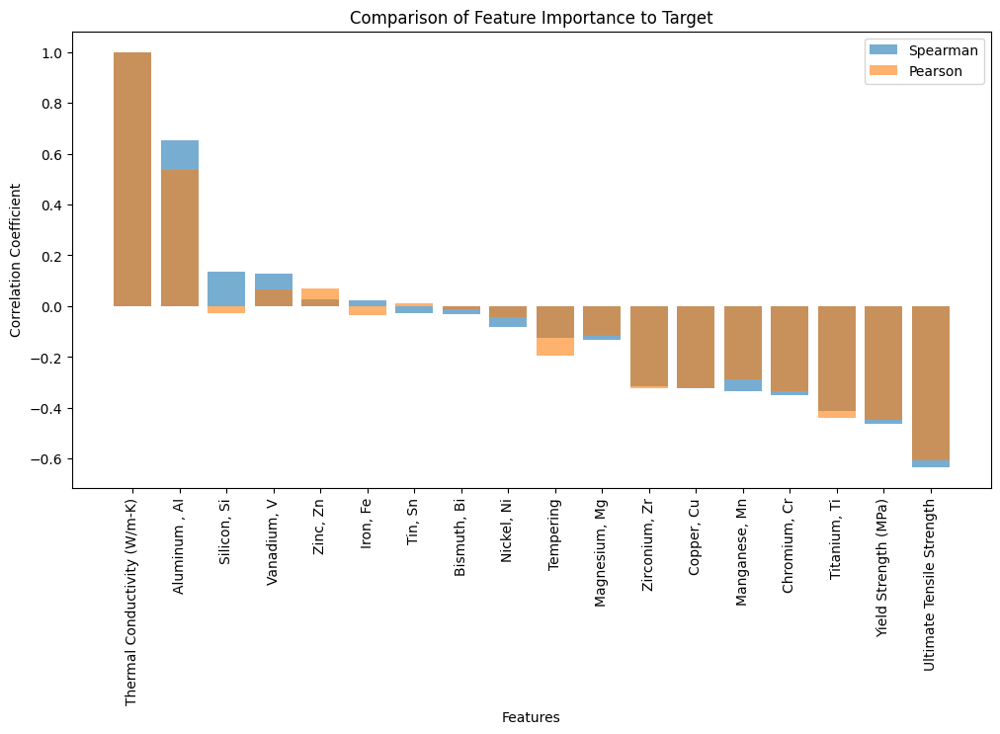

Tempering                         int64
Thermal Conductivity (W/m-K)    float64
Ultimate Tensile Strength       float64
Yield Strength (MPa)            float64
Aluminum , AI                   float64
Silicon, Si                     float64
Copper, Cu                      float64
Iron, Fe                        float64
Magnesium, Mg                   float64
Zinc, Zn                        float64
Manganese, Mn                   float64
Titanium, Ti                    float64
Chromium, Cr                    float64
Nickel, Ni                      float64
Zirconium, Zr                   float64
Tin, Sn                         float64
Vanadium, V                     float64
Bismuth, Bi                     float64
dtype: object


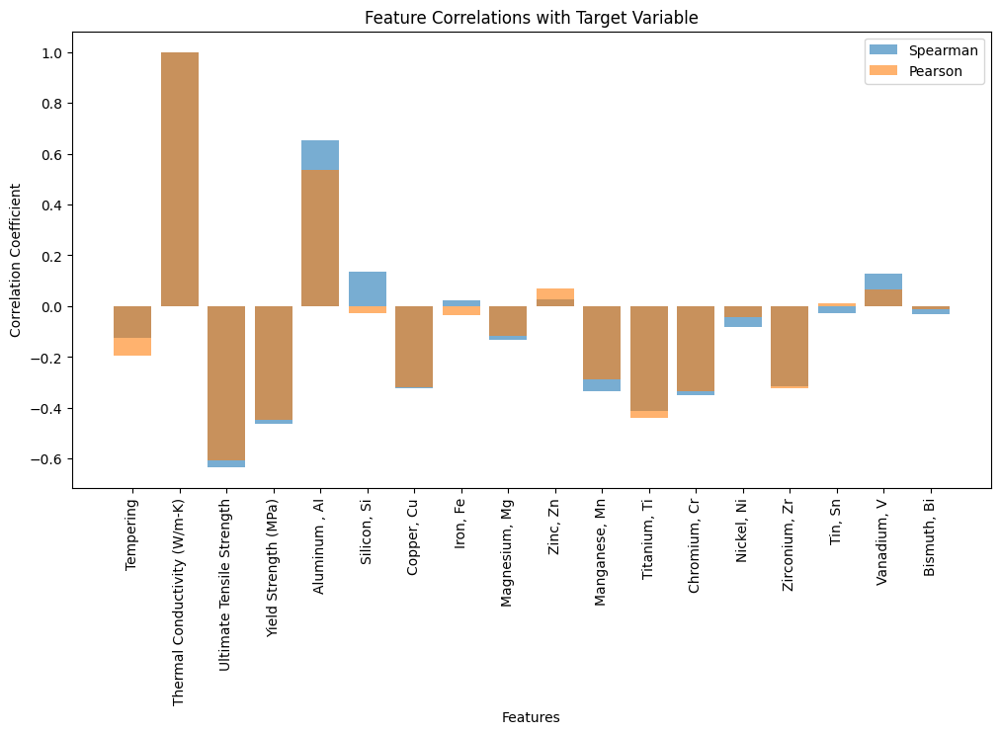

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
import catboost as cb
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os

# Step 1: Load the dataset
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Show head, data types and description
print(df.head())
print(df.dtypes)
print(df.describe())

# Step 4: Drop columns 'Alloy name'
df_reduced = df.drop(columns=['Alloy name'])

# Step 5: Ensure all values in the 'Tempering' column are consistent and then apply label encoding
df_reduced['Tempering'] = df_reduced['Tempering'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['Tempering'] = encoder.fit_transform(df_reduced['Tempering'])

# Step 6: Draw a Spearman correlation heatmap with Blues
corr = df_reduced.corr(method='spearman')
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
plt.title('Spearman Correlation Heatmap')
plt.savefig('/kaggle/working/spearman_correlation_heatmap.png', dpi=500)
plt.show()

# Step 7: Feature importance comparison using Spearman and Pearson
spearman_corr = corr['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)'].sort_values(ascending=False)

# Plot both correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Comparison of Feature Importance to Target')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/correlation_comparison.png', dpi=100)
plt.show()

# Step 8: Eliminate poorly correlated features (correlation < |0.001|)
low_corr_features = corr.columns[abs(corr['Thermal Conductivity (W/m-K)']) < 0.001]
df_reduced = df_reduced.drop(columns=low_corr_features)

# Step 9: Show new dataset with their datatype
print(df_reduced.dtypes)

# Step 10: Find Spearman and Pearson correlations with the target variable
spearman_corr = df_reduced.corr(method='spearman')['Thermal Conductivity (W/m-K)']
pearson_corr = df_reduced.corr()['Thermal Conductivity (W/m-K)']

# Plot correlations
plt.figure(figsize=(12, 6))
plt.bar(spearman_corr.index, spearman_corr.values, label='Spearman', alpha=0.6)
plt.bar(pearson_corr.index, pearson_corr.values, label='Pearson', alpha=0.6)
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.title('Feature Correlations with Target Variable')
plt.xticks(rotation=90)
plt.legend()
plt.savefig('/kaggle/working/feature_correlation_target.png', dpi=1000)
plt.show()

# Save Spearman and Pearson values to CSV
corr_df = pd.DataFrame({'Spearman': spearman_corr, 'Pearson': pearson_corr})
corr_df.to_csv('/kaggle/working/feature_correlations.csv', index=True)

# Step 11: Split the data into training and testing sets
X = df_reduced.drop(columns=['Thermal Conductivity (W/m-K)'])
y = df_reduced['Thermal Conductivity (W/m-K)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 12: Define all models with predefined hyperparameters from the CSV file
models = {
    'XGB': xgb.XGBRegressor(n_estimators=135, max_depth=3, learning_rate=0.19957617),
    'CB': cb.CatBoostRegressor(iterations=912, depth=3, learning_rate=0.055646369, verbose=0),
    'GB': GradientBoostingRegressor(n_estimators=244, max_depth=3, learning_rate=0.097171524),
    'SE': StackingRegressor(estimators=[
        ('rf', RandomForestRegressor()),
        ('dt', DecisionTreeRegressor())
    ], final_estimator=LinearRegression()),
    'DT': DecisionTreeRegressor(max_depth=11),
    'RF': RandomForestRegressor(n_estimators=120, max_depth=9),
    'AB': AdaBoostRegressor(n_estimators=148, learning_rate=0.06430105),
    'KNN': KNeighborsRegressor(n_neighbors=6),
    'LR': LinearRegression(),
}

# Step 13: Train models with predefined hyperparameters
best_models = {}
for model_name, model in models.items():
    model.fit(X_train, y_train)
    best_models[model_name] = model

# Step 14: Evaluate models
eval_results = []
for model_name, model in best_models.items():
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    eval_results.append([model_name, r2, rmse, mae])

eval_results_df = pd.DataFrame(eval_results, columns=['Model', 'R²', 'RMSE', 'MAE'])
eval_results_df.to_csv('/kaggle/working/model_evaluations.csv', index=False)


# Loop through the models in best_models
for model_name, model in best_models.items():
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate evaluation metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    
    # Create the plot with high resolution
    plt.figure(figsize=(10, 8), dpi=1000)  # High resolution (1000 dpi for clarity)
    
    # Scatter plot for actual vs predicted
    plt.scatter(y_test, y_test, color='red', label='Actual', alpha=0.6, s=200)
    plt.scatter(y_test, y_pred, color='blue', label='Predicted', alpha=0.6, s=200)
    
    # Plot the diagonal line (perfect prediction) with a solid line and increased width
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='black', linestyle='-', label='Perfect Prediction', linewidth=3)
    
    # Add labels and title with Times New Roman font, bold, and slightly larger size
    plt.xlabel('Actual TC', fontsize=22, fontweight='bold', fontname='Times New Roman')
    plt.ylabel('Predicted TC', fontsize=22, fontweight='bold', fontname='Times New Roman')
    plt.title(f'{model_name}', fontsize=24, fontweight='bold', fontname='Times New Roman')
    
    # Display R², RMSE, and MAE values on the plot
    plt.text(0.05, 0.95, f'R²: {r2:.2f}\nRMSE: {rmse:.2f}\nMAE: {mae:.2f}',
             transform=plt.gca().transAxes, fontsize=20, fontweight='bold', verticalalignment='top', color='black', fontname='Times New Roman')
    
    # Make axis rule scaling numbers bold and larger
    plt.xticks(fontsize=16, fontweight='bold')  # Set x-axis tick labels to larger size and bold
    plt.yticks(fontsize=16, fontweight='bold')  # Set y-axis tick labels to larger size and bold
    
    # Save the plot with the highest resolution (1000 dpi)
    plt.savefig(f'predicted_vs_actual_{model_name}.png', dpi=1000)  # Saving at 1000 dpi
    plt.show()

    # Save the data (actual vs predicted) to a CSV file
    plot_data = pd.DataFrame({
        'Actual': y_test,
        'Predicted': y_pred
    })
    plot_data.to_csv(f'predicted_vs_actual_{model_name}.csv', index=False)


SHAP Values and Beeswarm Plot

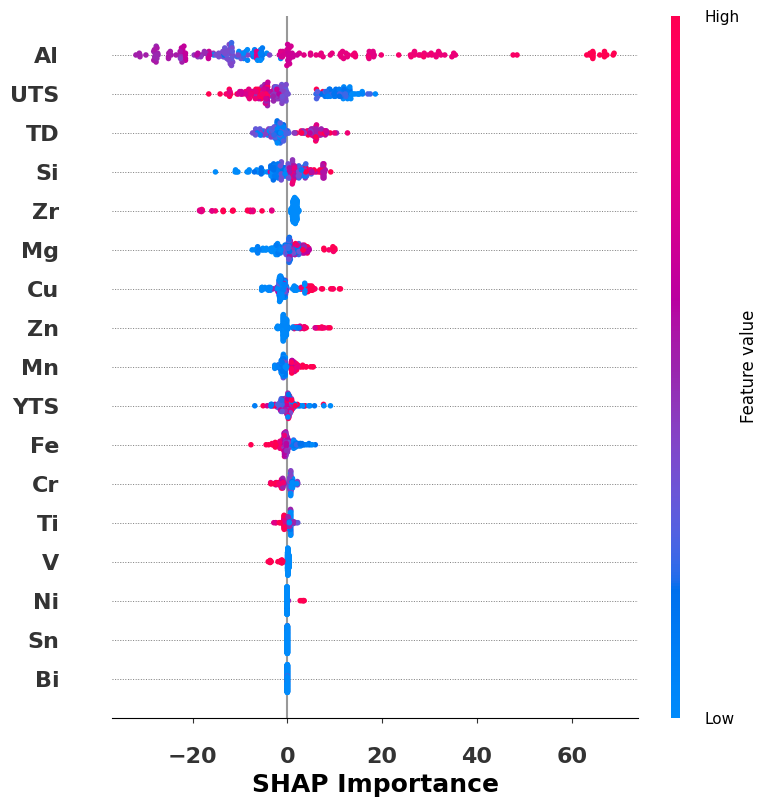

Feature importance values have been saved to 'feature_importance_shap_with_gridlines.xlsx'.


In [12]:
# Import necessary libraries
import pandas as pd
import numpy as np
import xgboost as xgb
import shap
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Step 1: Load the dataset
file_path = '/kaggle/input/final-dataset/Final Dataset with Tempering.xlsx'
df = pd.read_excel(file_path)

# Step 2: Fill empty cells with zeros
df.fillna(0, inplace=True)

# Step 3: Rename columns to shorter names
df.rename(columns={
    'Thermal Conductivity (W/m-K)': 'TC',
    'Ultimate Tensile Strength': 'UTS',
    'Yield Strength (MPa)': 'YTS',
    'Aluminum , AI': 'Al',
    'Silicon, Si': 'Si',
    'Copper, Cu': 'Cu',
    'Iron, Fe': 'Fe',
    'Magnesium, Mg': 'Mg',
    'Zinc, Zn': 'Zn',
    'Manganese, Mn': 'Mn',
    'Titanium, Ti': 'Ti',
    'Chromium, Cr': 'Cr',
    'Nickel, Ni': 'Ni',
    'Zirconium, Zr': 'Zr',
    'Tin, Sn': 'Sn',
    'Vanadium, V': 'V',
    'Bismuth, Bi': 'Bi',
    'Tempering': 'TD'
}, inplace=True)

# Step 4: Drop the 'Alloy name' column
df_reduced = df.drop(columns=['Alloy name'])

# Step 5: Ensure all values in the 'TD' column are consistent and apply label encoding
df_reduced['TD'] = df_reduced['TD'].astype(str)  # Convert all to string

# Apply LabelEncoder
encoder = LabelEncoder()
df_reduced['TD'] = encoder.fit_transform(df_reduced['TD'])

# Step 6: Split the data into training and testing sets
X = df_reduced.drop(columns=['TC'])
y = df_reduced['TC']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 7: Define the XGBoost model with predefined hyperparameters
xgb_model = xgb.XGBRegressor(
    n_estimators=135, 
    max_depth=3, 
    learning_rate=0.19957617
)

# Step 8: Train the XGBoost model
xgb_model.fit(X_train, y_train)

# Step 9: Use SHAP to calculate feature importance
explainer = shap.Explainer(xgb_model, X_train)
shap_values = explainer(X_train)

# Step 10: Capture the SHAP summary plot using a figure with no text
fig = plt.figure(figsize=(20, 16))
shap.summary_plot(shap_values, X_train, show=False)

# Customize font settings for larger and bold text
plt.rcParams.update({
    'font.family': 'Times New Roman',  # Set font to Times New Roman
    'font.size': 18,                   # Increase font size
    'axes.labelsize': 18,              # Larger axis labels font size
    'xtick.labelsize': 16,             # X-axis tick font size
    'ytick.labelsize': 16,             # Y-axis tick font size
    'axes.titleweight': 'bold',        # Bold axis titles
})

# Add the title, axis labels, and ticks back
plt.xlabel('SHAP Importance', fontsize=18, fontweight='bold')
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')

# Add horizontal dotted grey gridlines
plt.grid(True, axis='y', linestyle=':', color='grey', linewidth=0.7)

# Save the plot as a high-resolution image
fig.savefig('/kaggle/working/shap_feature_importance_plot_with_gridlines.png', format='png', dpi=1000)

# Display the plot
plt.show()

# Step 11: Extract feature importance values and save them to an Excel file
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'SHAP Importance': np.abs(shap_values.values).mean(axis=0)
})

# Sort by importance
feature_importance_sorted = feature_importance.sort_values(by='SHAP Importance', ascending=False)

# Save to Excel
feature_importance_sorted.to_excel('/kaggle/working/feature_importance_shap_with_gridlines.xlsx', index=False)

print("Feature importance values have been saved to 'feature_importance_shap_with_gridlines.xlsx'.")
